In [1]:
import torch

def clear_gpu_memory():
    torch.cuda.empty_cache()
    torch.cuda.synchronize()
    for obj in dir():
        if torch.is_tensor(obj):
            del globals()[obj]
    torch.cuda.empty_cache()

# Call the function to clear GPU memory
clear_gpu_memory()


AlexNet

In [1]:
import torch
from torch import nn
from d2l import torch as d2l

In [3]:
class AlexNet(d2l.Classifier):
    def __init__(self, lr=0.1, num_classes=10):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.LazyConv2d(96, kernel_size=11, stride=4, padding=1),
            nn.ReLU(), nn.MaxPool2d(kernel_size=3, stride=2),
            nn.LazyConv2d(256, kernel_size=5, padding=2), nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.LazyConv2d(384, kernel_size=3, padding=1), nn.ReLU(),
            nn.LazyConv2d(384, kernel_size=3, padding=1), nn.ReLU(),
            nn.LazyConv2d(256, kernel_size=3, padding=1), nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2), nn.Flatten(),
            nn.LazyLinear(4096), nn.ReLU(), nn.Dropout(p=0.5),
            nn.LazyLinear(4096), nn.ReLU(),nn.Dropout(p=0.5),
            nn.LazyLinear(num_classes))
        self.net.apply(d2l.init_cnn)

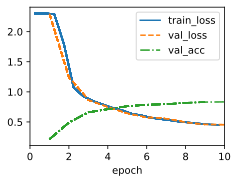

In [4]:
model = AlexNet(lr=0.01)
data = d2l.FashionMNIST(batch_size=128, resize=(224, 224))
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)

Simplify

In [1]:
import torch
from torch import nn
from d2l import torch as d2l

In [8]:
class SimpleAlexNet(d2l.Classifier):
    def __init__(self, lr=0.1, num_classes=10):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.LazyConv2d(96, kernel_size=11, stride=4, padding=1),
            nn.ReLU(), nn.MaxPool2d(kernel_size=3, stride=2),
            nn.LazyConv2d(256, kernel_size=5, padding=2), nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.LazyConv2d(256, kernel_size=3, padding=1), nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2), nn.Flatten(),
            nn.LazyLinear(4096), nn.ReLU(), nn.Dropout(p=0.5),
            nn.LazyLinear(num_classes))
        self.net.apply(d2l.init_cnn)

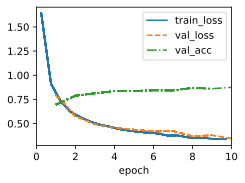

In [10]:
model = SimpleAlexNet(lr=0.01)
data = d2l.FashionMNIST(batch_size=128, resize=(224, 224))
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)

LetNet-5

In [14]:
class LeNet(d2l.Classifier):
    def __init__(self, lr=0.1, num_classes=10):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.LazyConv2d(8, kernel_size=4),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.LazyConv2d(20, kernel_size=5), nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),nn.Flatten(),nn.Dropout(0.25),
            nn.LazyLinear(76), nn.ReLU(), nn.Dropout(0.25),
            nn.LazyLinear(num_classes))

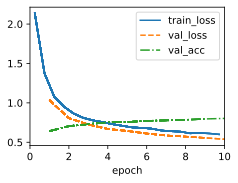

In [15]:
model = LeNet(lr=0.01)
data = d2l.FashionMNIST(batch_size=128, resize=(28, 28))
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)

Adding ReLU and especially dropout to the model improves the validation accuracy dramtically.

Batch Normalization and Learning Rates

Normalized

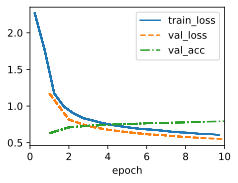

In [19]:
model = LeNet(lr=0.01)
data = d2l.FashionMNIST(batch_size=128, resize=(28, 28))
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)


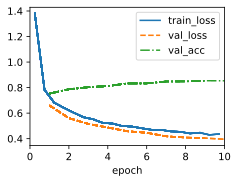

In [20]:
model = LeNet(lr=0.05)
data = d2l.FashionMNIST(batch_size=128, resize=(28, 28))
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)


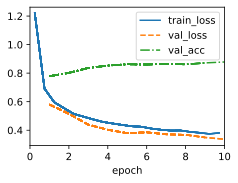

In [21]:
model = LeNet(lr=0.1)
data = d2l.FashionMNIST(batch_size=128, resize=(28, 28))
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)


Non-Normalized

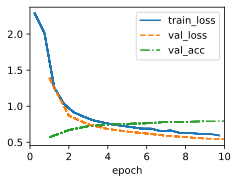

In [17]:
model = LeNet(lr=0.01)
data = d2l.FashionMNIST(batch_size=128)
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)


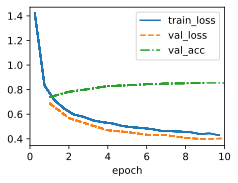

In [22]:
model = LeNet(lr=0.05)
data = d2l.FashionMNIST(batch_size=128)
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)


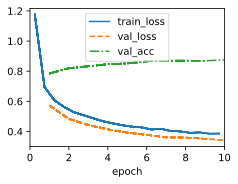

In [23]:
model = LeNet(lr=0.1)
data = d2l.FashionMNIST(batch_size=128)
trainer = d2l.Trainer(max_epochs=10, num_gpus=1)
trainer.fit(model, data)


For both the batch normalized and non normalized cases, as the lr goes from 0.01 to 0.1, the validation accuracy increases slightly and the validation loss drops slightly as well.

RNN

In [24]:
%matplotlib inline
import math
import torch
from torch import nn
from torch.nn import functional as F
from d2l import torch as d2l

In [41]:
class RNNScratch(d2l.Module):  #@save
    """The RNN model implemented from scratch."""
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.W_xh = nn.Parameter(
            torch.randn(num_inputs, num_hiddens) * sigma)
        self.W_hh = nn.Parameter(
            torch.randn(num_hiddens, num_hiddens) * sigma)
        self.b_h = nn.Parameter(torch.zeros(num_hiddens))

    def forward(self, inputs, state=None):
        if state is None:
            # Initial state with shape: (batch_size, num_hiddens)
            state = torch.zeros((inputs.shape[1], self.num_hiddens),
                            device=inputs.device)
        else:
            state, = state
        outputs = []
        for X in inputs:  # Shape of inputs: (num_steps, batch_size, num_inputs)
            state = torch.tanh(torch.matmul(X, self.W_xh) +
                            torch.matmul(state, self.W_hh) + self.b_h)
            outputs.append(state)
        return outputs, state

    def forward(self, inputs, state=None):
        if state is None:
            # Initial state with shape: (batch_size, num_hiddens)
            state = torch.zeros((inputs.shape[1], self.num_hiddens),
                            device=inputs.device)
        else:
            state, = state
        outputs = []
        for X in inputs:  # Shape of inputs: (num_steps, batch_size, num_inputs)
            state = torch.tanh(torch.matmul(X, self.W_xh) +
                            torch.matmul(state, self.W_hh) + self.b_h)
            outputs.append(state)
        return outputs, state

In [42]:
class RNNLMScratch(d2l.Classifier):  #@save
    """The RNN-based language model implemented from scratch."""
    def __init__(self, rnn, vocab_size, lr=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.init_params()

    def init_params(self):
        self.W_hq = nn.Parameter(
            torch.randn(
                self.rnn.num_hiddens, self.vocab_size) * self.rnn.sigma)
        self.b_q = nn.Parameter(torch.zeros(self.vocab_size))

    def training_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=True)
        return l

    def validation_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=False)

    def forward(self, X, state=None):
        embs = self.one_hot(X)
        rnn_outputs, _ = self.rnn(embs, state)
        return self.output_layer(rnn_outputs)

    def one_hot(self, X):
    # Output shape: (num_steps, batch_size, vocab_size)
        return F.one_hot(X.T, self.vocab_size).type(torch.float32)
    
    def output_layer(self, rnn_outputs):
        outputs = [torch.matmul(H, self.W_hq) + self.b_q for H in rnn_outputs]
        return torch.stack(outputs, 1)

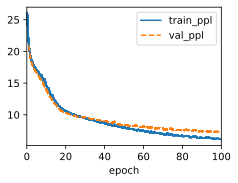

In [17]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = RNNLMScratch(rnn, vocab_size=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
clear_gpu_memory()

In [55]:
class newRNNLMScratch(d2l.Classifier):
    def __init__(self, rnn, vocab_size, embedding_dim, lr=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.init_params()
   
    def init_params(self):
        self.W_hq = nn.Parameter(
            torch.randn(
                self.rnn.num_hiddens, self.embedding_dim) * self.rnn.sigma)
        self.b_q = nn.Parameter(torch.zeros(self.embedding_dim))
        self.lembs = nn.Parameter(torch.randn(self.vocab_size, self.embedding_dim))

    def training_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=True)
        return l

    def validation_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=False)

    def forward(self, X, state=None):
        embs = torch.matmul(self.one_hot(X).float(),self.lembs)
        rnn_outputs, _ = self.rnn(embs, state)
        return self.output_layer(rnn_outputs)
    
    def one_hot(self, X):
        # Output shape: (num_steps, batch_size, vocab_size)
        return F.one_hot(X.T, self.vocab_size).type(torch.float32)
    
    def output_layer(self, rnn_outputs):
        outputs = [torch.matmul(H, self.W_hq) + self.b_q for H in rnn_outputs]
        return torch.stack(outputs, 1)

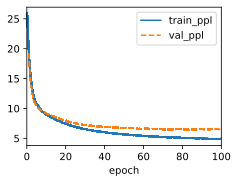

In [56]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = newRNNLMScratch(rnn, vocab_size=len(data.vocab),embedding_dim=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)


Sampling Prediction Method

In [67]:
class sampleRNNLMScratch(d2l.Classifier):
    def __init__(self, rnn, vocab_size, embedding_dim, lr=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.rnn = rnn
        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.init_params()
   
    def init_params(self):
        self.W_hq = nn.Parameter(
            torch.randn(
                self.rnn.num_hiddens, self.embedding_dim) * self.rnn.sigma)
        self.b_q = nn.Parameter(torch.zeros(self.embedding_dim))
        self.lembs = nn.Parameter(torch.randn(self.vocab_size, self.embedding_dim))

    def training_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=True)
        return l

    def validation_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('ppl', torch.exp(l), train=False)

    def forward(self, X, state=None):
        embs = torch.matmul(self.one_hot(X).float(), self.lembs)
        rnn_outputs, _ = self.rnn(embs, state)
        return self.output_layer(rnn_outputs)
    
    def one_hot(self, X):
        return F.one_hot(X.T, self.vocab_size).type(torch.float32)
    
    def output_layer(self, rnn_outputs):
        outputs = [torch.matmul(H, self.W_hq) + self.b_q for H in rnn_outputs]
        return torch.stack(outputs, 1)
    
    def predict(self, prefix, num_preds, vocab, device=None, alpha=1, sample=True):
        state, outputs = None, []
        for char in prefix:
            if char in vocab.token_to_idx:
                outputs.append(vocab.token_to_idx[char])
            else:
                # Handle out-of-vocabulary characters
                pass
        
        for i in range(num_preds):
            X = torch.tensor([[outputs[-1]]], device=device)
            embs = self.one_hot(X)
            rnn_outputs, state = self.rnn(embs, state)
            Y = self.output_layer(rnn_outputs)
            prob = F.softmax(Y[0], dim=-1)
            prob = prob.pow(alpha)
            prob /= prob.sum(dim=-1).reshape(-1, 1)
            if sample:
                outputs.append(torch.multinomial(prob, num_samples=1))
            else:
                outputs.append(torch.argmax(Y, axis=-1))
        return ''.join([vocab.idx_to_token[i] for i in outputs])



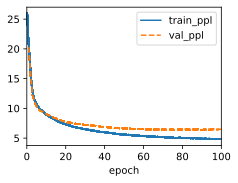

In [65]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = sampleRNNLMScratch(rnn, vocab_size=len(data.vocab),embedding_dim=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)

In [69]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = sampleRNNLMScratch(rnn, vocab_size=len(data.vocab),embedding_dim=len(data.vocab), lr=1)

In [70]:
# Generate predictions
prefix = "The time machine"
num_preds = 100
predictions = model.predict(prefix, num_preds, data.vocab)

print("Generated text:")
print(prefix + predictions)

Generated text:
The time machinehe time machinetuqqxzahwc jolrngyoythutrj<unk>dgeiwiuvzofqpsui zammhacnopvfodvl aplcbxtmqmsjvwkikufiqkzmzzvmvcly<unk>usddq<unk>


With this change the text becomes completely unintelligible.

Clipping Gradient

In [91]:
class ClipTrain(d2l.Trainer):
    def fit_epoch(self):
        train_loss = self._run_batches(self.train_dataloader, training=True)
        valid_loss = self._run_batches(self.val_dataloader) if self.val_dataloader else 0
        return train_loss, valid_loss

    def _run_batches(self, dataloader, training=False):
        self.model.train(training)
        total_loss = 0
        batch_count = 0
        with torch.set_grad_enabled(training):
            for batch in dataloader:
                loss = self._compute_loss(batch, training)
                if loss is None:
                    print("Warning: Loss calculation returned None for a batch.")
                    continue  # Skip this batch and proceed to the next one
                if training:
                    self._backward_and_optimize(loss)
                total_loss += loss.item()  # Use .item() to get the numerical value of the loss tensor
                batch_count += 1
        return total_loss / batch_count if batch_count > 0 else 0

    def _compute_loss(self, batch, training):
        loss_func = self.model.training_step if training else self.model.validation_step
        try:
            loss = loss_func(self.prepare_batch(batch))
            if loss is None:
                print("Warning: Loss calculation returned None.")
            return loss
        except Exception as e:
            print(f"Error during loss calculation: {e}")
            return None

    def _backward_and_optimize(self, loss):
        self.optim.zero_grad()
        loss.backward()
        self.optim.step()


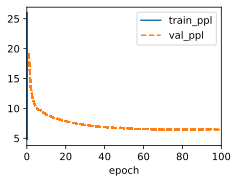

In [92]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNNScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = sampleRNNLMScratch(rnn, vocab_size=len(data.vocab),embedding_dim=len(data.vocab), lr=1)
trainer = ClipTrain(max_epochs=100, num_gpus=1)
trainer.fit(model, data)


Not clipping the gradient causes the val_ppl to become significantly more choppy. For some reason, it also caused the loss output to produce NaN values, but this is likely due to an error in the code.

Autoregressive Model

In [2]:
class Data(d2l.DataModule):
    def __init__(self, batch_size=16, T=1000, num_train=600, tau=4):
        self.save_hyperparameters()
        self.time = torch.arange(1, T + 1, dtype=torch.float32)
        self.x = torch.sin(0.01 * self.time) + torch.randn(T) * 0.2

In [3]:
@d2l.add_to_class(Data)
def get_dataloader(self, train):
    features = [self.x[i : self.T-self.tau+i] for i in range(self.tau)]
    self.features = torch.stack(features, 1)
    self.labels = self.x[self.tau:].reshape((-1, 1))
    i = slice(0, self.num_train) if train else slice(self.num_train, None)
    return self.get_tensorloader([self.features, self.labels], train, i)

In [4]:
class RNN(d2l.Module):  #@save
    """The RNN model implemented with high-level APIs."""
    def __init__(self, num_inputs, num_hiddens):
        super().__init__()
        self.save_hyperparameters()
        self.rnn = nn.RNN(num_inputs, num_hiddens)

    def forward(self, inputs, H=None):
        return self.rnn(inputs, H)

In [11]:
class RNNLMnew(d2l.RNNLMScratch):
    def __init__(self, rnn, vocab_size, lr=0.01, tau=4, plot_flag=True, embedding_dim=8):
        super().__init__(rnn, vocab_size, lr=lr)
        self.save_hyperparameters()
        self.init_params()   

    def init_params(self):
        self.linear = nn.LazyLinear(1)

    def forward(self, X, state=None):
        rnn_outputs, _ = self.rnn(X.swapaxes(0, 1), state)
        outputs = [self.linear(H) for H in rnn_outputs]
        return torch.stack(outputs, 1)


In [13]:
data = Data()
print(data)
rnn1 = RNN(num_inputs=1, num_hiddens=8)
model = RNNLMnew(rnn=rnn1, lr=0.01, embedding_dim = 8, vocab_size=1000)
trainer = d2l.Trainer(max_epochs=20)
trainer.fit(model, data)

c:\Users\aidan\PythonEnvironment\AI\lib\site-packages\torch\nn\modules\lazy.py:181: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


RuntimeError: input.size(-1) must be equal to input_size. Expected 1, got 16

LSTM

In [14]:
class Data(d2l.DataModule):
    def __init__(self, batch_size=16, T=1000, num_train=600, tau=4, randn=0.2):
        self.save_hyperparameters()
        self.time = torch.range(1, T, dtype=torch.float32)
        self.x = torch.sin(0.01*self.time) + torch.randn(T)*randn
        
    def get_dataloader(self, train):
        features = [self.x[i:self.T-self.tau+i] for i in range(self.tau)]
        self.features = torch.stack(features, 1)
        self.labels = self.x[self.tau:].reshape((-1, 1))
        i = slice(0, self.num_train) if train else slice(self.num_train, None)
        return self.get_tensorloader([self.features, self.labels], train, i)
    
class RNNAutoRegression(d2l.LinearRegression):  #@save
    """The RNN-based language model implemented with high-level APIs."""
    def init_params(self):
        self.linear = nn.LazyLinear(1)

    # def output_layer(self, hiddens):
    #     return self.linear(hiddens).swapaxes(0, 1)
    
    def __init__(self, rnn,lr=0.01, tau=4, plot_flag=True, emb_len=8):
        super().__init__(lr=lr)
        self.save_hyperparameters()
        self.init_params()   

    def forward(self, X, state=None):
        rnn_outputs, _ = self.rnn(X, state)
        return self.linear(rnn_outputs)
        # return rnn_outputs

In [16]:
class LSTM(d2l.RNN):  #@save
    """The multilayer GRU model."""
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens, num_layers,
                          dropout=dropout)

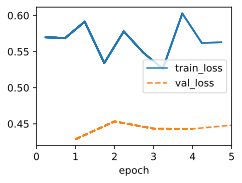

In [24]:
data = Data()
lstm = LSTM(num_inputs=4, num_hiddens=40, num_layers = 100)
model = RNNAutoRegression(rnn=lstm, lr=0.01)
trainer = d2l.Trainer(max_epochs=5)
trainer.fit(model, data)

Implement LSTM in place of GRU

In [15]:
class LSTM(d2l.RNN):  #@save
    """The multilayer GRU model."""
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens, num_layers,
                          dropout=dropout)

In [26]:
class GRU(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.GRU(num_inputs, num_hiddens)

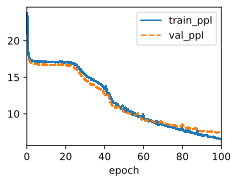

In [29]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=32, num_layers=2)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1)
trainer.fit(model, data)


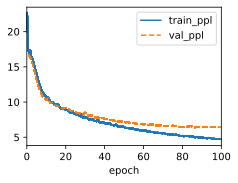

In [28]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
gru = GRU(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1)
trainer.fit(model, data)

Bidirectional RNN

In [31]:
class BiRNN(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens, num_layers):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.RNN(num_inputs, num_hiddens, num_layers=num_layers, bidirectional=True)
        self.num_hiddens *= 2

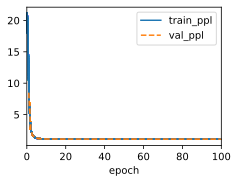

In [39]:
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
birnn = BiRNN(num_inputs=len(data.vocab), num_hiddens=32, num_layers=2) 
model = d2l.RNNLM(birnn, vocab_size=len(data.vocab), lr=2)  
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1)
trainer.fit(model, data)
